In [1]:
import torch

a = torch.tensor([[0.2, 0.8], [0.3, 0.7], [0.6, 0.4]])
b = torch.tensor([1, 0, 1])

ce_loss = torch.nn.CrossEntropyLoss()

In [2]:
a.shape

torch.Size([3, 2])

In [3]:
b.shape

torch.Size([3])

In [18]:
import numpy as np

def open_image(img_path):
    return np.array(Image.open(img_path).convert('RGB'))

In [61]:
from methods.fixmatch import FixMatch
from methods.supervised import SupervisedModel

# fixmatch_model = FixMatch.load_from_checkpoint("/home/treerspeaking/src/python/cabdefect/lightning_logs/version_30/checkpoints/epoch=299-step=7500.ckpt")
supervised_model = SupervisedModel.load_from_checkpoint("/home/treerspeaking/src/python/cabdefect/lightning_logs/version_149/checkpoints/supervisedepoch=398-val/accuracy=0.9200.ckpt")

In [62]:
from dataset.Dataset import MultiTaskCabDataset

data = MultiTaskCabDataset("data", split="test")

Discovered task: co_dinh_cap with classes: ['Ảnh sai', 'Ảnh đúng']
Discovered task: han_box with classes: ['han_open', 'han_close']


Loaded 69 images for test split


In [63]:
from torchvision.transforms import v2
trans = v2.Compose([
    v2.ToTensor(),
    v2.Resize([224, 224]),
    # v2.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    v2.Normalize(mean=[0, 0 , 0], std=[1, 1, 1]),
])

trans_view = v2.Compose([
    v2.ToTensor(),
    v2.Resize([224, 224]),
])

In [64]:
model_used = supervised_model

In [65]:
import numpy as np

import matplotlib.pyplot as plt
import matplotlib.cm as cm
from PIL import Image

import cv2

def open_and_plot_cam(img_path, model):
    # # img = trans_view(data.data[pic_num])
    img = trans_view(open_image(img_path))
    input = trans(img).unsqueeze(0)
    cam, out_pred = model(input.to("cuda"))
    

    # Create a figure with 2 rows
    fig, ax = plt.subplots(3, 3, figsize=(12, 10))

    # First row - Original visualization
    # Original image
    ax[0, 0].imshow(img.permute(1, 2, 0))
    ax[0, 0].set_title('Original Image')
    ax[0, 0].axis('off')

    # CAM visualization for class 0 and 1
    ax[0, 1].imshow(cam[0, 0].detach().cpu())
    ax[0, 1].set_title('CAM - Class 0')
    ax[0, 1].axis('off')

    ax[0, 2].imshow(cam[0, 1].detach().cpu())
    ax[0, 2].set_title('CAM - Class 1')
    ax[0, 2].axis('off')

    # Second row - Overlay visualizations
    # Create normalized CAMs for overlays

    cam_0 = cv2.resize(cam[0, 0].detach().cpu().numpy(), dsize=[224, 224])
    cam_1 = cv2.resize( cam[0, 1].detach().cpu().numpy(), dsize=(224, 224))

    # Normalize CAMs to 0-1 range for visualization
    cam_0 = (cam_0 - cam_0.min()) / (cam_0.max() - cam_0.min())
    cam_1 = (cam_1 - cam_1.min()) / (cam_1.max() - cam_1.min())

    # Overlay CAM on original image
    original_img = img.permute(1, 2, 0).numpy()
    ax[1, 1].imshow(original_img)
    cam_0_heatmap = ax[1, 1].imshow(cam_0, cmap='jet', alpha=0.5)
    ax[1, 1].set_title('Class 0 CAM Overlay task 0')
    ax[1, 1].axis('off')

    ax[1, 2].imshow(original_img)
    cam_1_heatmap = ax[1, 2].imshow(cam_1, cmap='jet', alpha=0.5)
    ax[1, 2].set_title('Class 1 CAM Overlay task 1')
    ax[1, 2].axis('off')

    # cam_2 = cv2.resize(cam[0, 2].detach().cpu().numpy(), dsize=[224, 224])
    # cam_3 = cv2.resize( cam[0, 3].detach().cpu().numpy(), dsize=(224, 224))

    # # Normalize CAMs to 0-1 range for visualization
    # cam_2 = (cam_2 - cam_2.min()) / (cam_2.max() - cam_2.min())
    # cam_3 = (cam_3 - cam_3.min()) / (cam_3.max() - cam_3.min())

    # # Overlay CAM on original image
    # original_img = img.permute(1, 2, 0).numpy()
    # ax[2, 1].imshow(original_img)
    # cam_2_heatmap = ax[2, 1].imshow(cam_2, cmap='jet', alpha=0.5)
    # ax[2, 1].set_title('Class 0 CAM Overlay task 1')
    # ax[2, 1].axis('off')

    # ax[2, 2].imshow(original_img)
    # cam_3_heatmap = ax[2, 2].imshow(cam_3, cmap='jet', alpha=0.5)
    # ax[2, 2].set_title('Class 1 CAM Overlay task 1')
    # ax[2, 2].axis('off')

    plt.tight_layout()
    plt.show()
    print(f"out_pred: {out_pred}")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [1.0864036e-05..1.0000002].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [1.0864036e-05..1.0000002].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [1.0864036e-05..1.0000002].


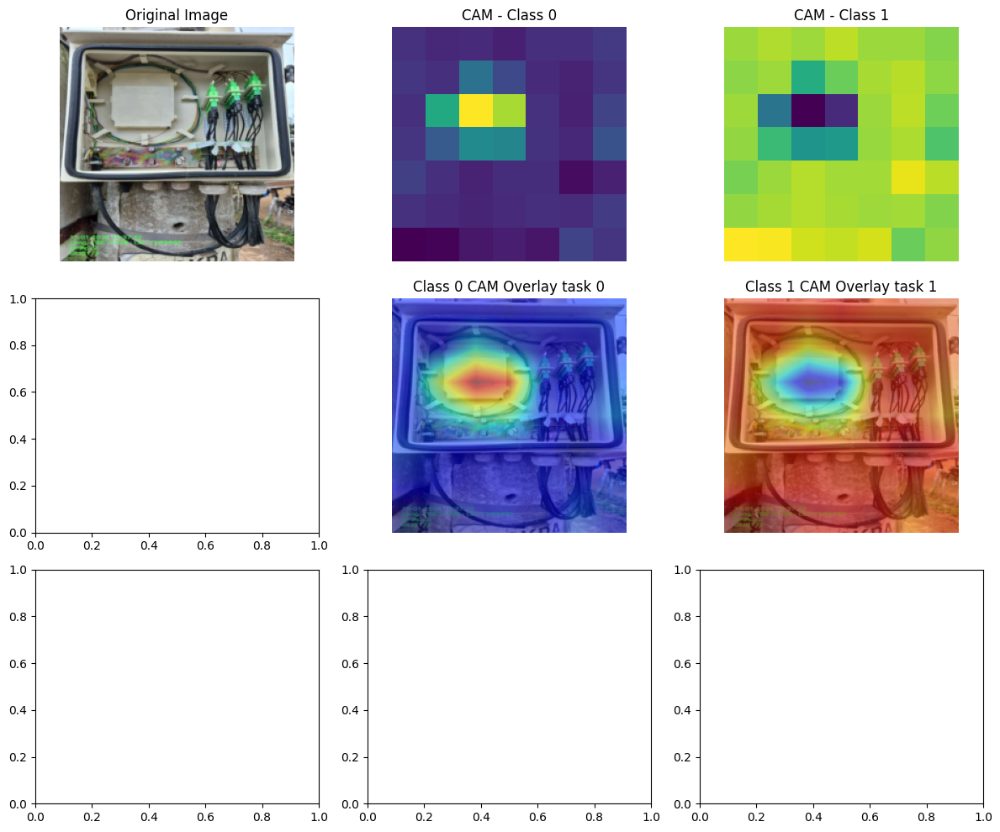

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.00018314172..1.0000002].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.00018314172..1.0000002].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.00018314172..1.0000002].


out_pred: [{'task_name': 'han_box', 'probabilities': tensor([[9.9999e-01, 1.1775e-05]], device='cuda:0', grad_fn=<SoftmaxBackward0>), 'predicted_class_names': ['close']}]


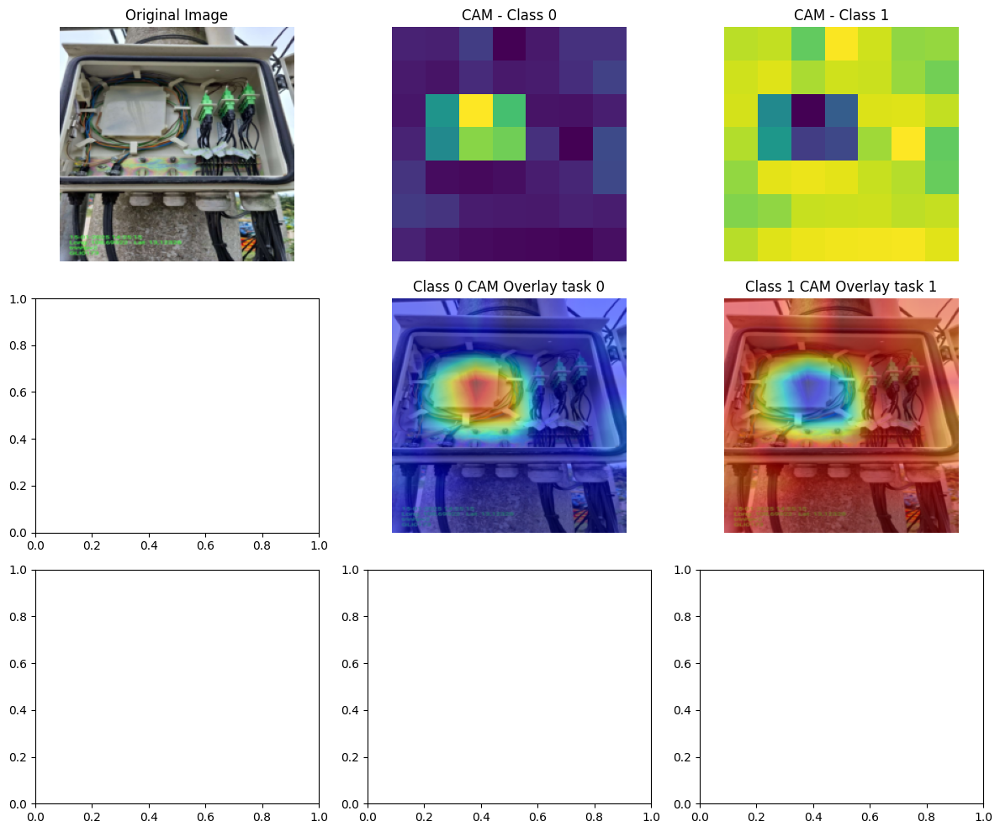

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.00090188795..1.0000001].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.00090188795..1.0000001].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.00090188795..1.0000001].


out_pred: [{'task_name': 'han_box', 'probabilities': tensor([[1.0000e+00, 1.7778e-06]], device='cuda:0', grad_fn=<SoftmaxBackward0>), 'predicted_class_names': ['close']}]


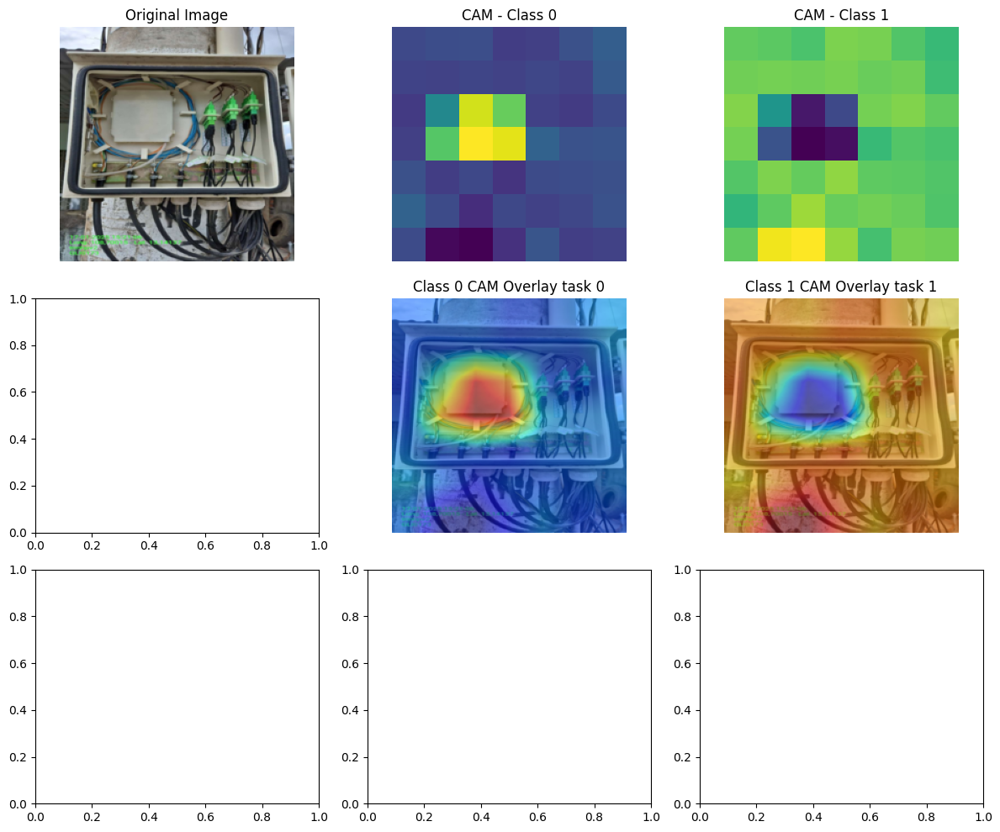

out_pred: [{'task_name': 'han_box', 'probabilities': tensor([[9.9998e-01, 1.7120e-05]], device='cuda:0', grad_fn=<SoftmaxBackward0>), 'predicted_class_names': ['close']}]


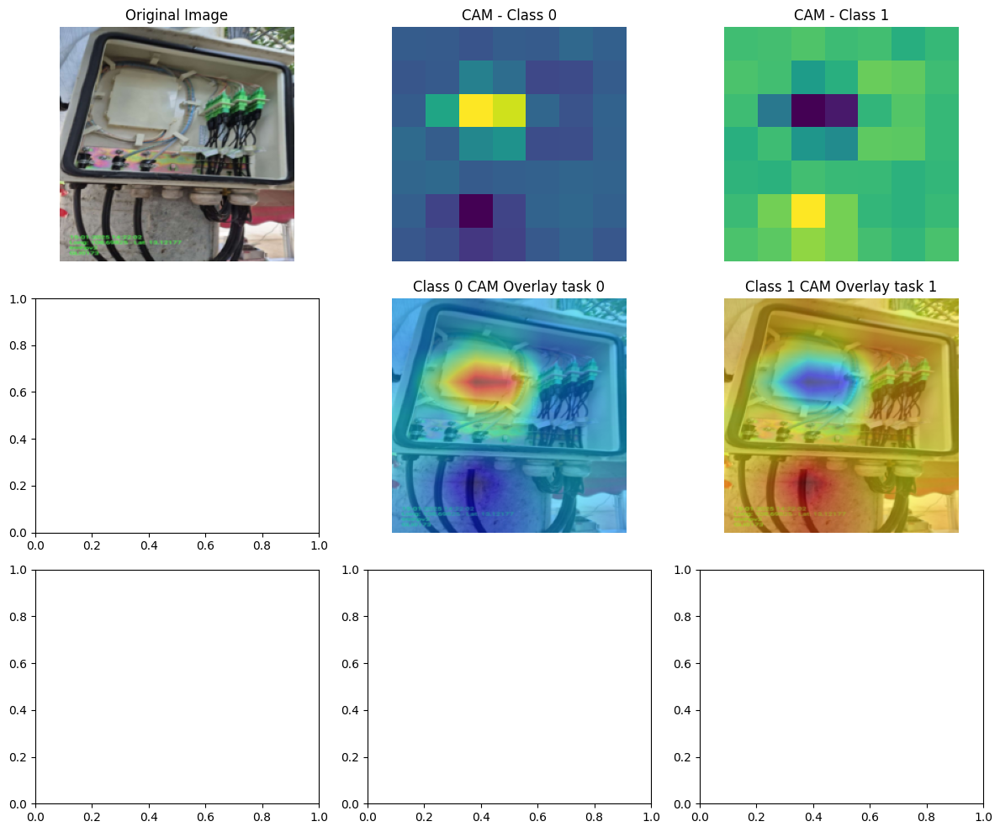

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.031830546..1.0000002].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.031830546..1.0000002].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.031830546..1.0000002].


out_pred: [{'task_name': 'han_box', 'probabilities': tensor([[9.9977e-01, 2.2893e-04]], device='cuda:0', grad_fn=<SoftmaxBackward0>), 'predicted_class_names': ['close']}]


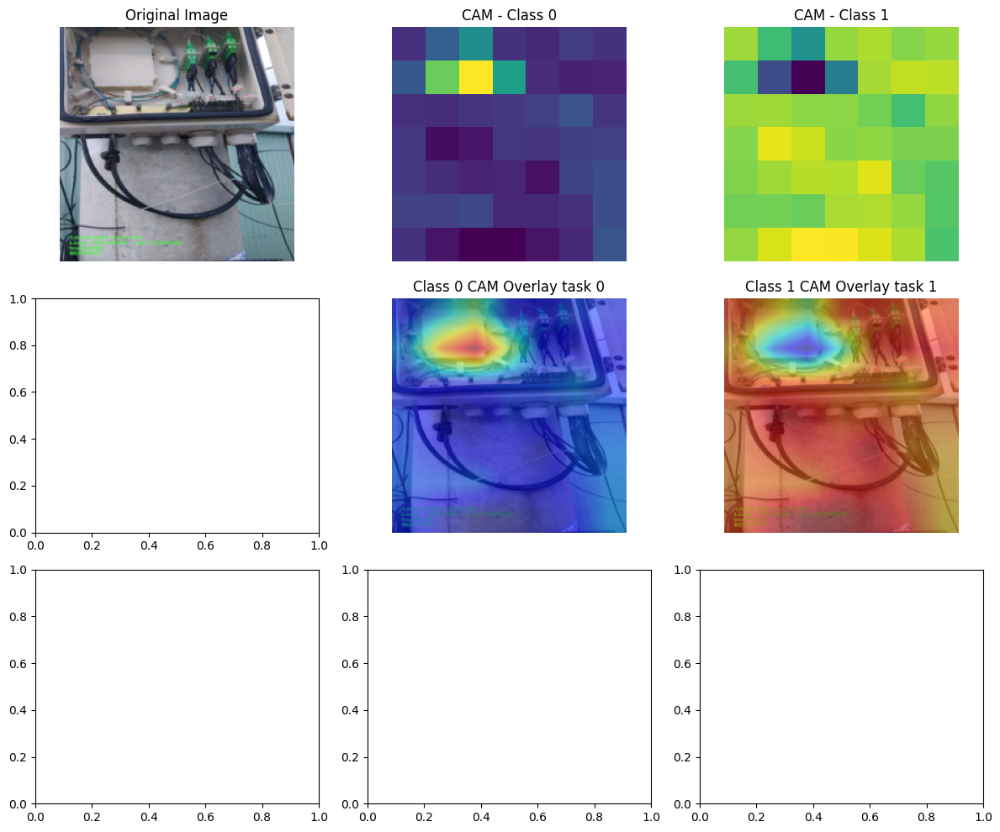

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.037524726..1.0000004].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.037524726..1.0000004].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.037524726..1.0000004].


out_pred: [{'task_name': 'han_box', 'probabilities': tensor([[9.9909e-01, 9.1372e-04]], device='cuda:0', grad_fn=<SoftmaxBackward0>), 'predicted_class_names': ['close']}]


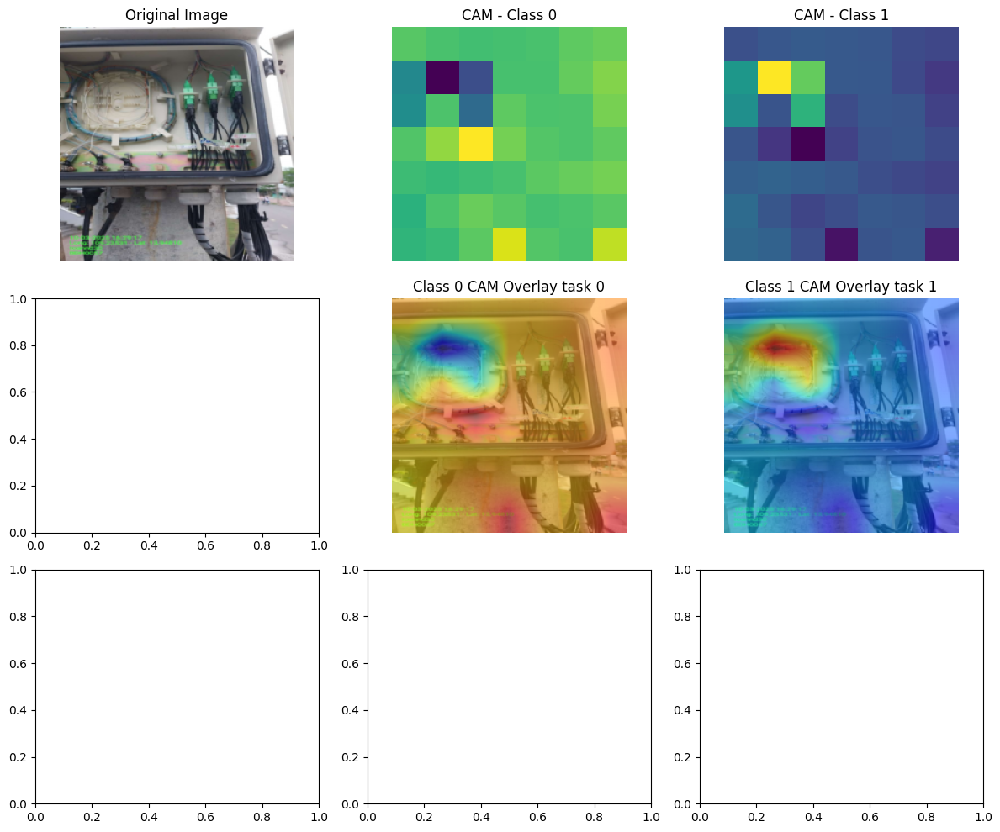

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0121688545..1.0000004].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0121688545..1.0000004].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0121688545..1.0000004].


out_pred: [{'task_name': 'han_box', 'probabilities': tensor([[0.0104, 0.9896]], device='cuda:0', grad_fn=<SoftmaxBackward0>), 'predicted_class_names': ['open']}]


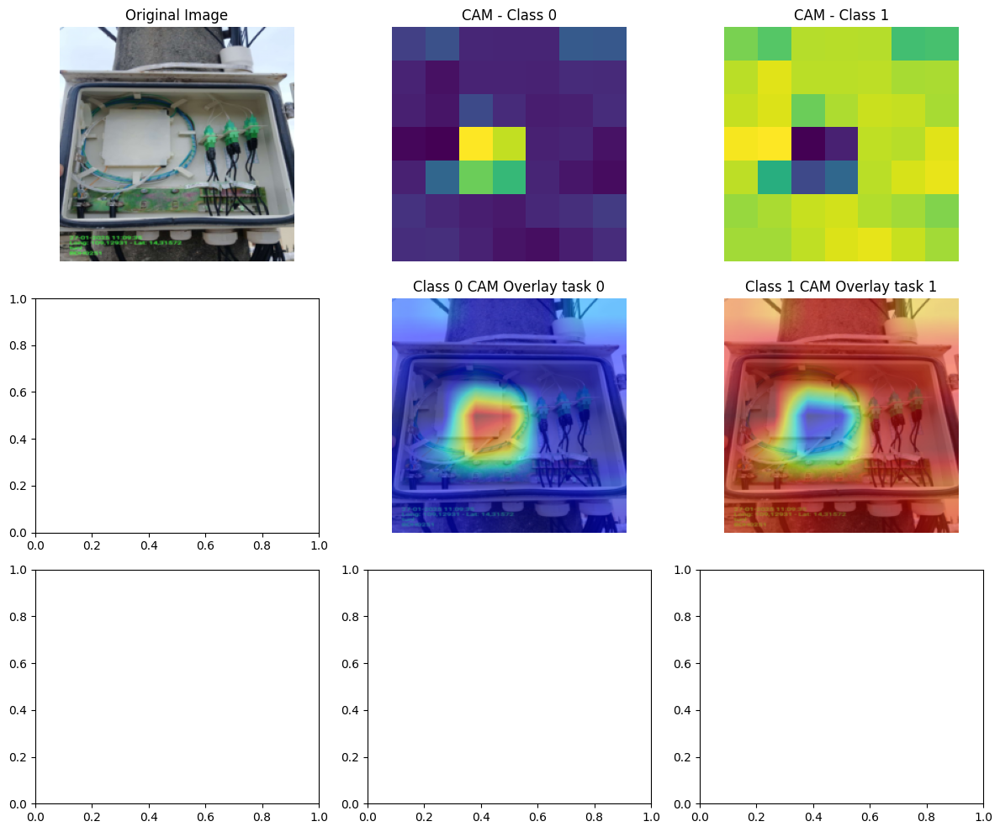

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0095985755..1.0000002].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0095985755..1.0000002].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0095985755..1.0000002].


out_pred: [{'task_name': 'han_box', 'probabilities': tensor([[9.9999e-01, 5.7928e-06]], device='cuda:0', grad_fn=<SoftmaxBackward0>), 'predicted_class_names': ['close']}]


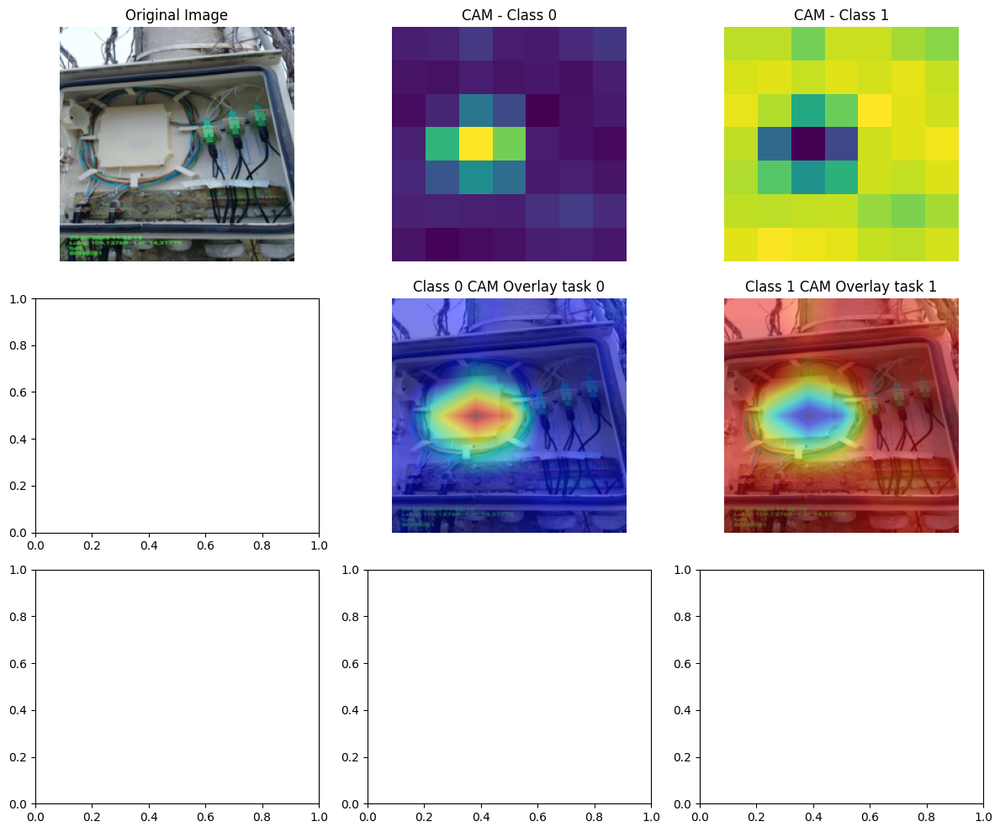

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.099254556..1.0000001].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.099254556..1.0000001].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.099254556..1.0000001].


out_pred: [{'task_name': 'han_box', 'probabilities': tensor([[1.0000e+00, 2.6661e-06]], device='cuda:0', grad_fn=<SoftmaxBackward0>), 'predicted_class_names': ['close']}]


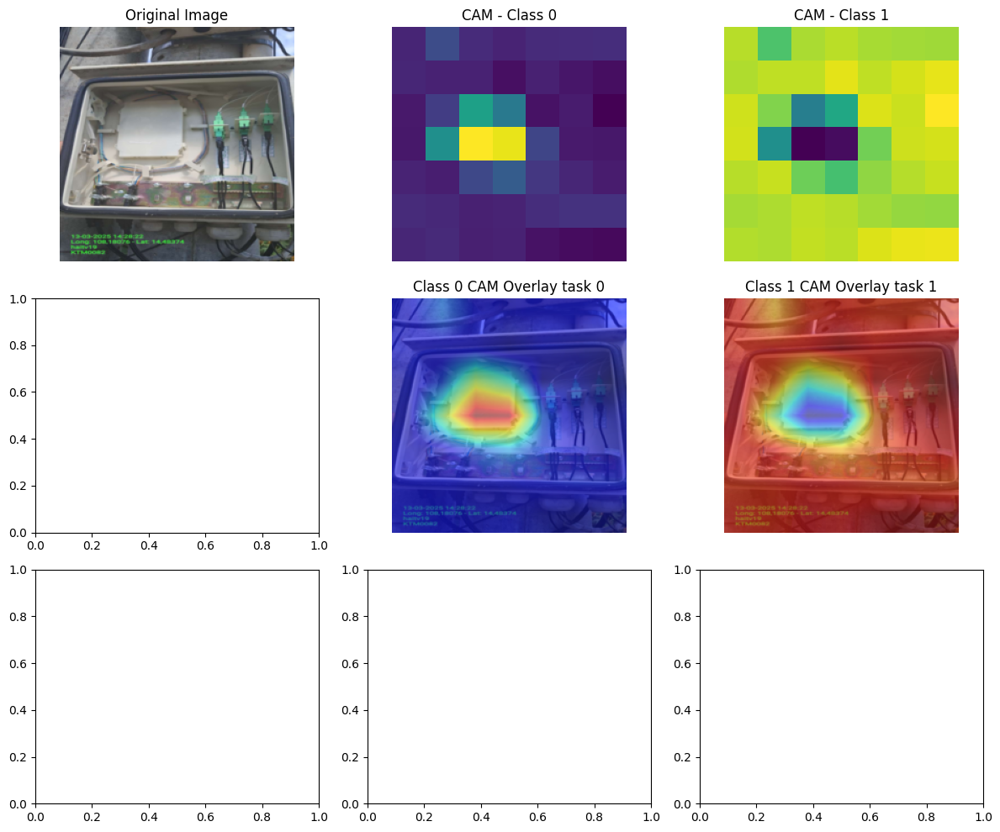

out_pred: [{'task_name': 'han_box', 'probabilities': tensor([[1.0000e+00, 3.5875e-06]], device='cuda:0', grad_fn=<SoftmaxBackward0>), 'predicted_class_names': ['close']}]


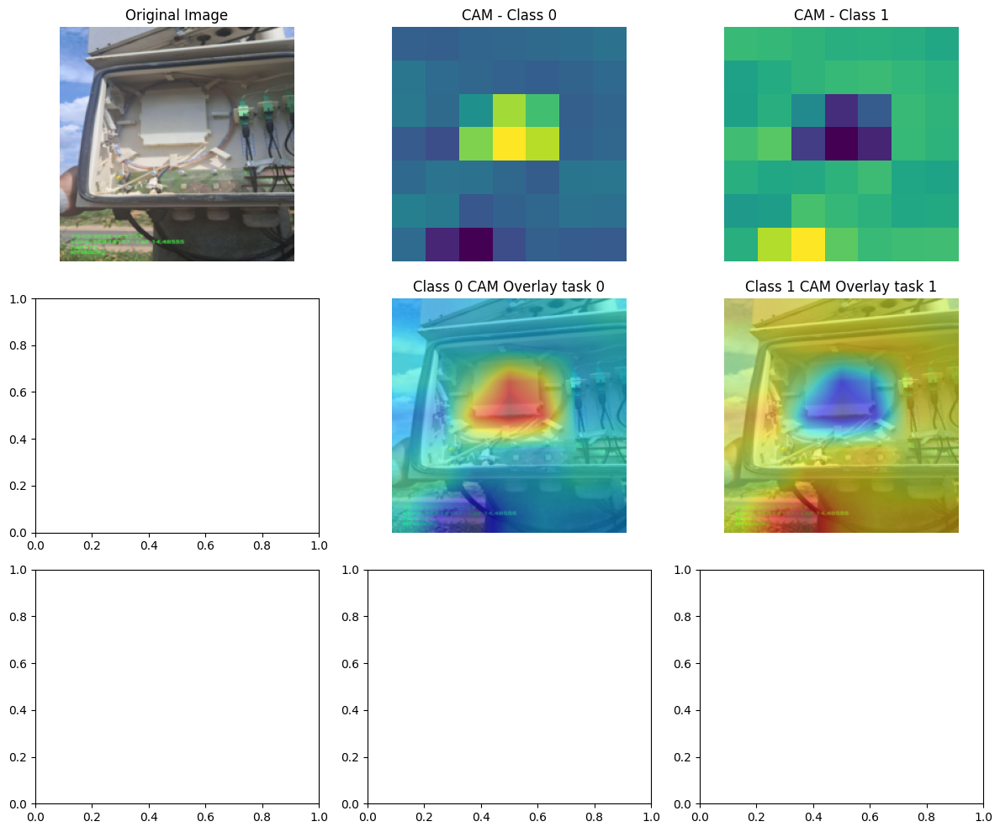

out_pred: [{'task_name': 'han_box', 'probabilities': tensor([[9.9999e-01, 1.1769e-05]], device='cuda:0', grad_fn=<SoftmaxBackward0>), 'predicted_class_names': ['close']}]


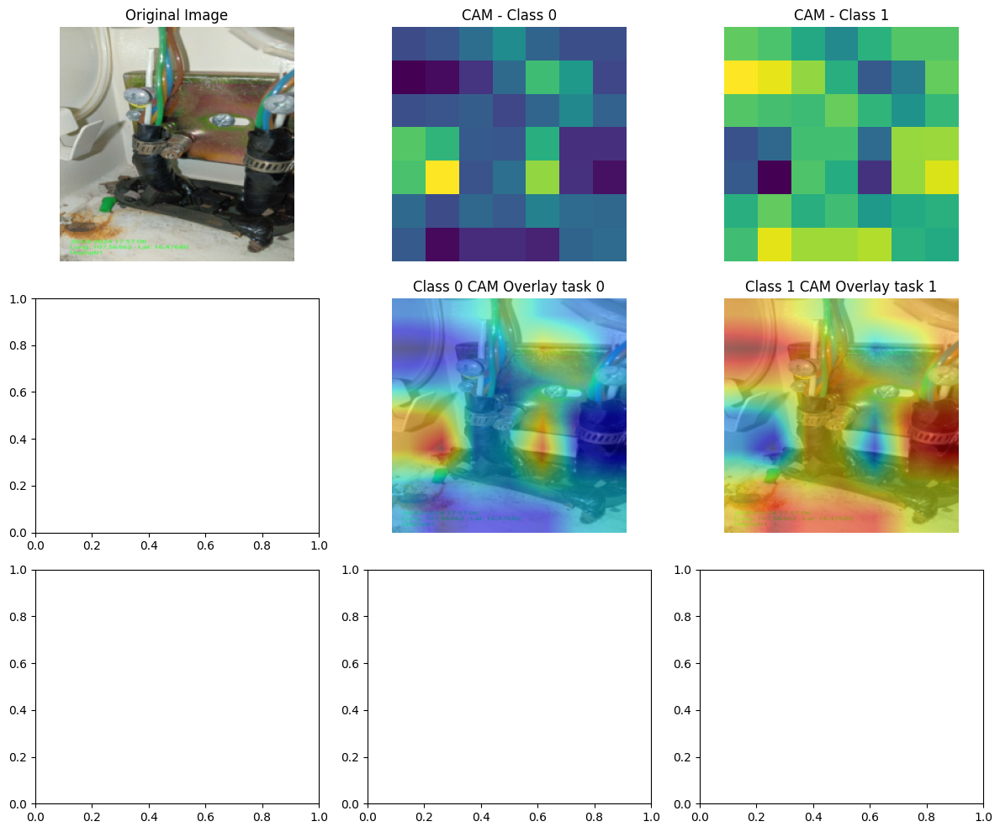

out_pred: [{'task_name': 'han_box', 'probabilities': tensor([[0.9927, 0.0073]], device='cuda:0', grad_fn=<SoftmaxBackward0>), 'predicted_class_names': ['close']}]


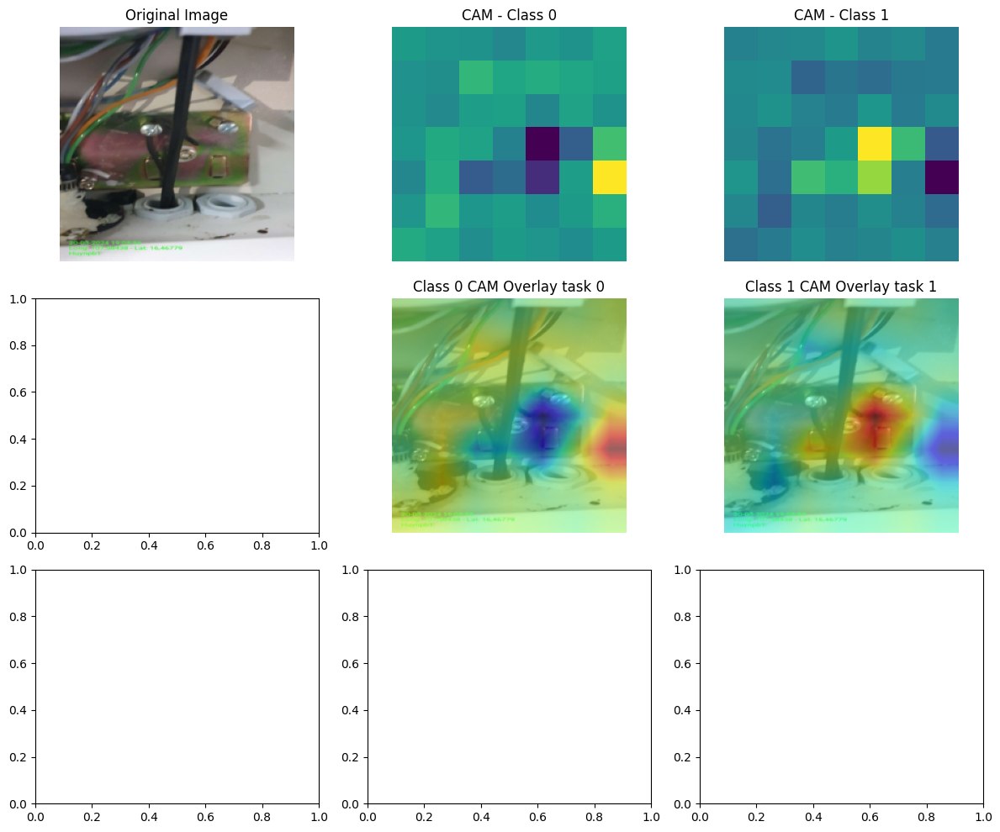

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [7.455161e-05..1.0000002].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [7.455161e-05..1.0000002].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [7.455161e-05..1.0000002].


out_pred: [{'task_name': 'han_box', 'probabilities': tensor([[0.7133, 0.2867]], device='cuda:0', grad_fn=<SoftmaxBackward0>), 'predicted_class_names': ['close']}]


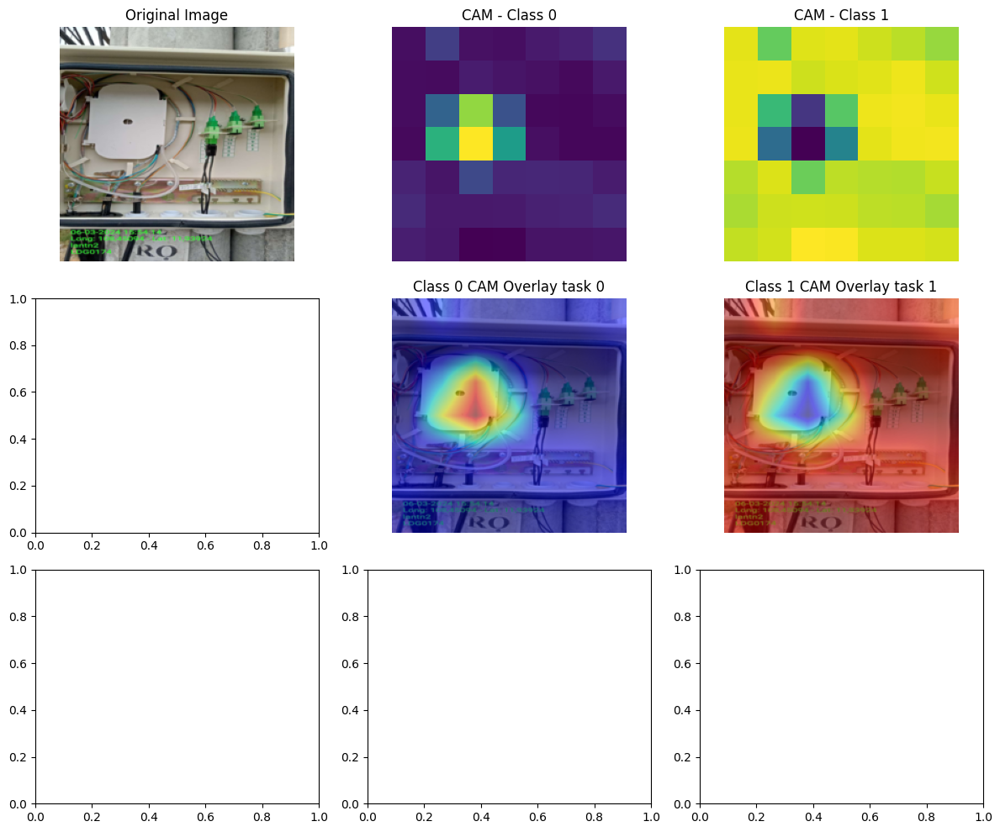

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.026331127..1.0000001].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.026331127..1.0000001].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.026331127..1.0000001].


out_pred: [{'task_name': 'han_box', 'probabilities': tensor([[1.0000e+00, 3.5155e-06]], device='cuda:0', grad_fn=<SoftmaxBackward0>), 'predicted_class_names': ['close']}]


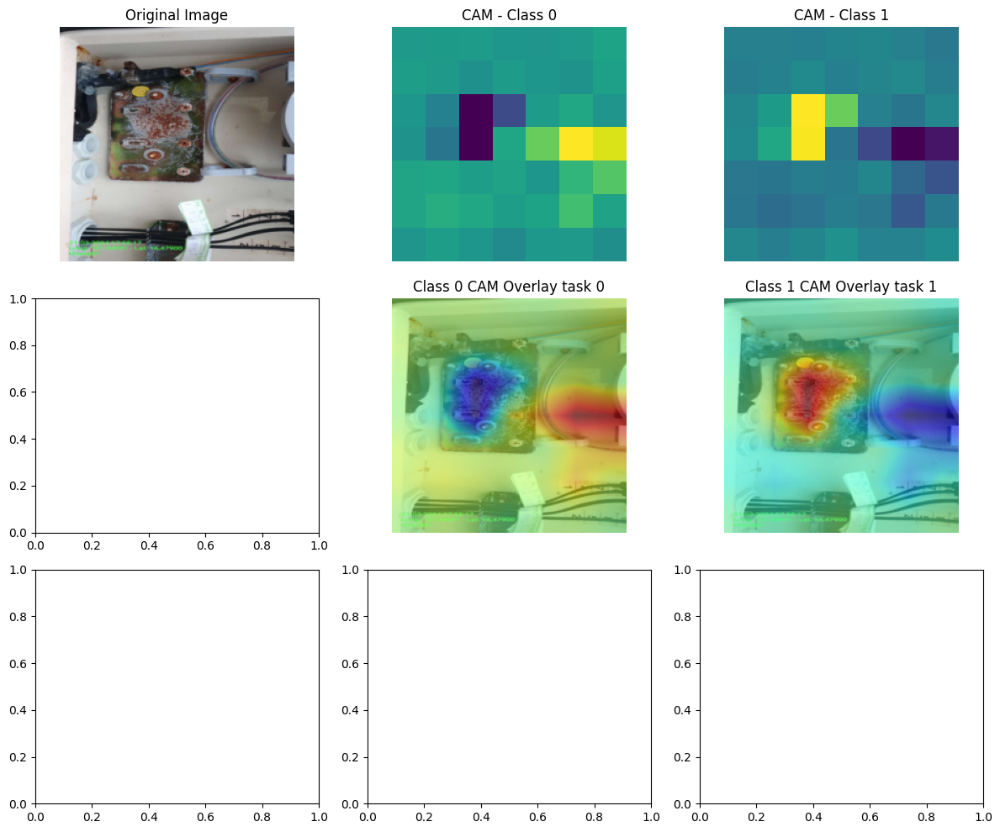

out_pred: [{'task_name': 'han_box', 'probabilities': tensor([[0.4075, 0.5925]], device='cuda:0', grad_fn=<SoftmaxBackward0>), 'predicted_class_names': ['open']}]


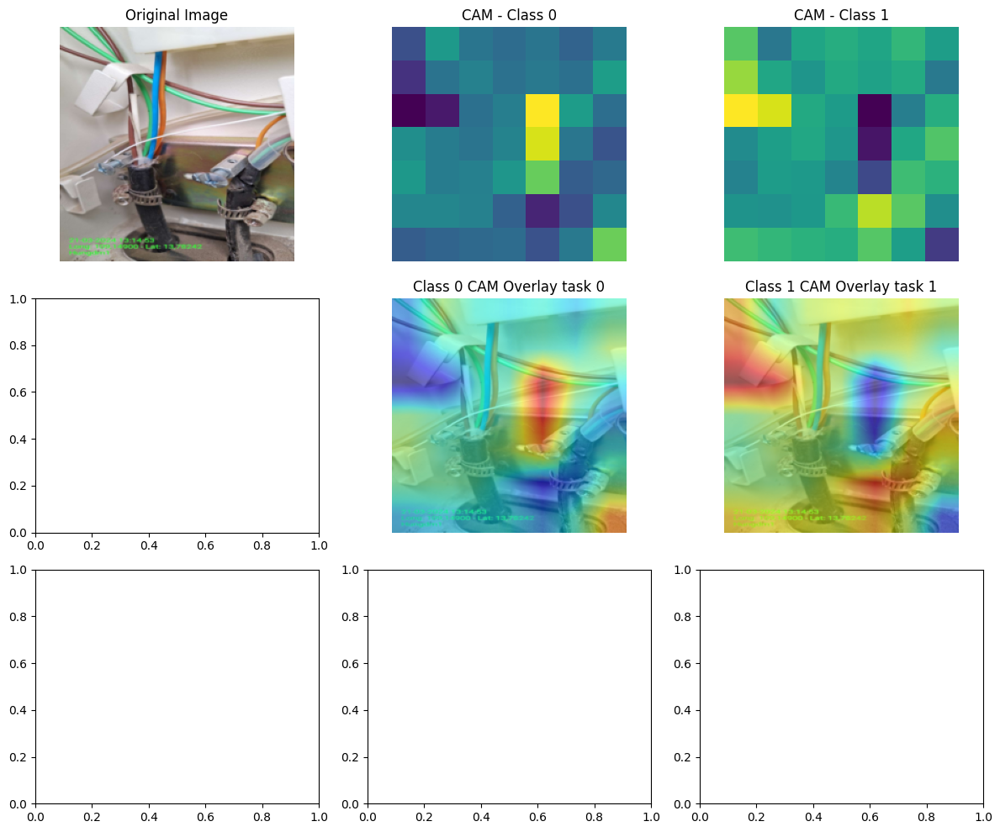

out_pred: [{'task_name': 'han_box', 'probabilities': tensor([[0.9974, 0.0026]], device='cuda:0', grad_fn=<SoftmaxBackward0>), 'predicted_class_names': ['close']}]


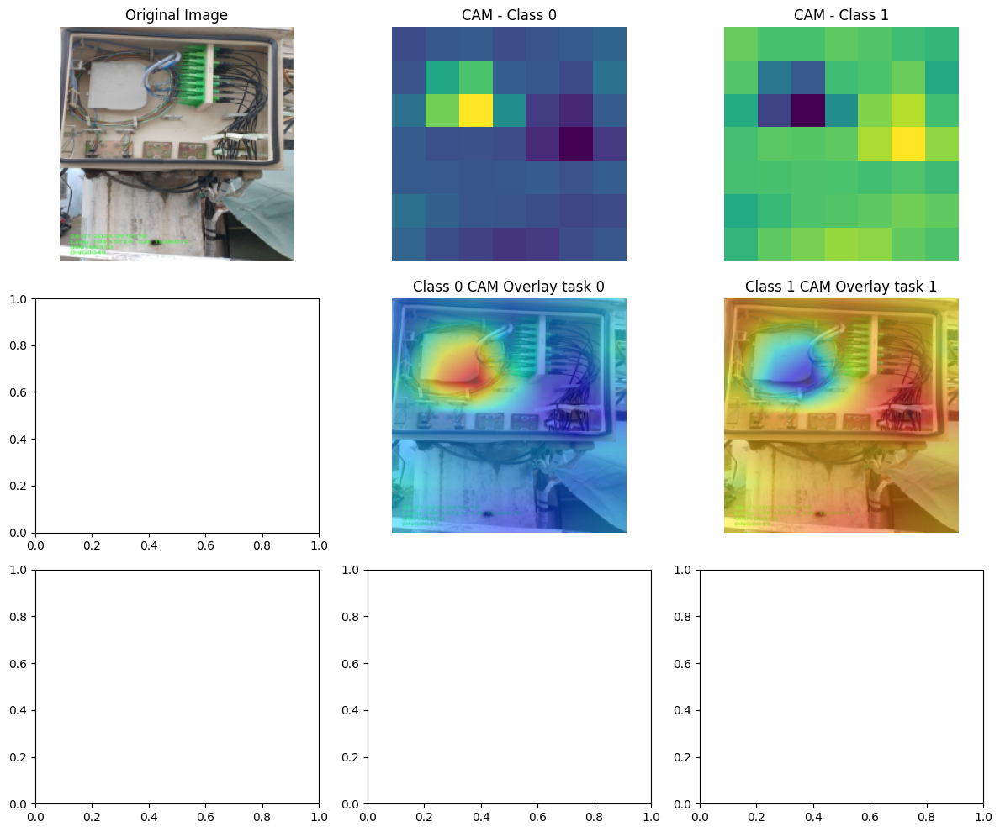

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.06604134..1.0000002].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.06604134..1.0000002].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.06604134..1.0000002].


out_pred: [{'task_name': 'han_box', 'probabilities': tensor([[0.9924, 0.0076]], device='cuda:0', grad_fn=<SoftmaxBackward0>), 'predicted_class_names': ['close']}]


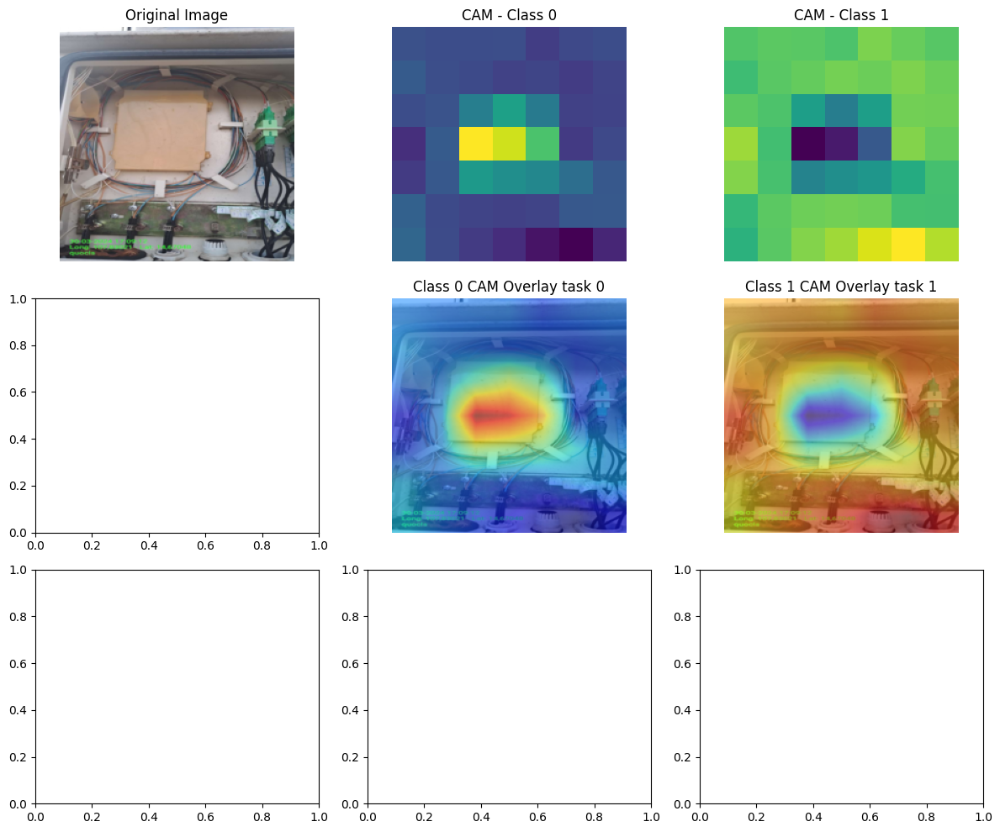

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.011812957..1.0000001].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.011812957..1.0000001].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.011812957..1.0000001].


out_pred: [{'task_name': 'han_box', 'probabilities': tensor([[9.9999e-01, 5.9024e-06]], device='cuda:0', grad_fn=<SoftmaxBackward0>), 'predicted_class_names': ['close']}]


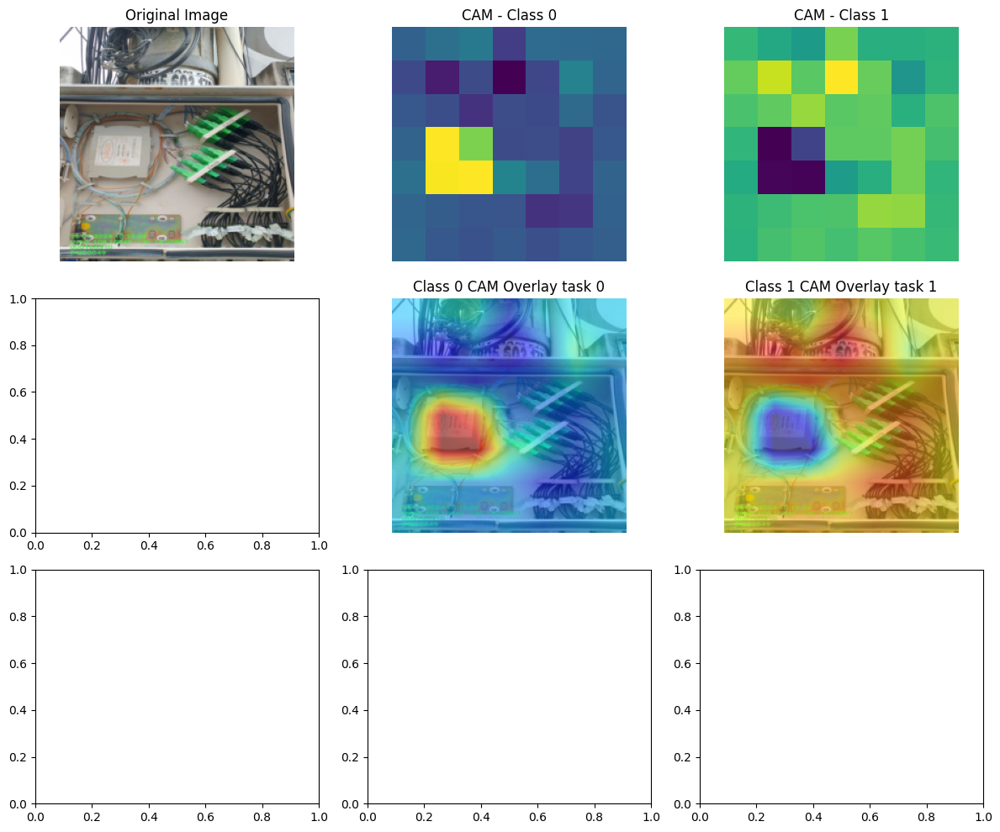

out_pred: [{'task_name': 'han_box', 'probabilities': tensor([[0.9982, 0.0018]], device='cuda:0', grad_fn=<SoftmaxBackward0>), 'predicted_class_names': ['close']}]


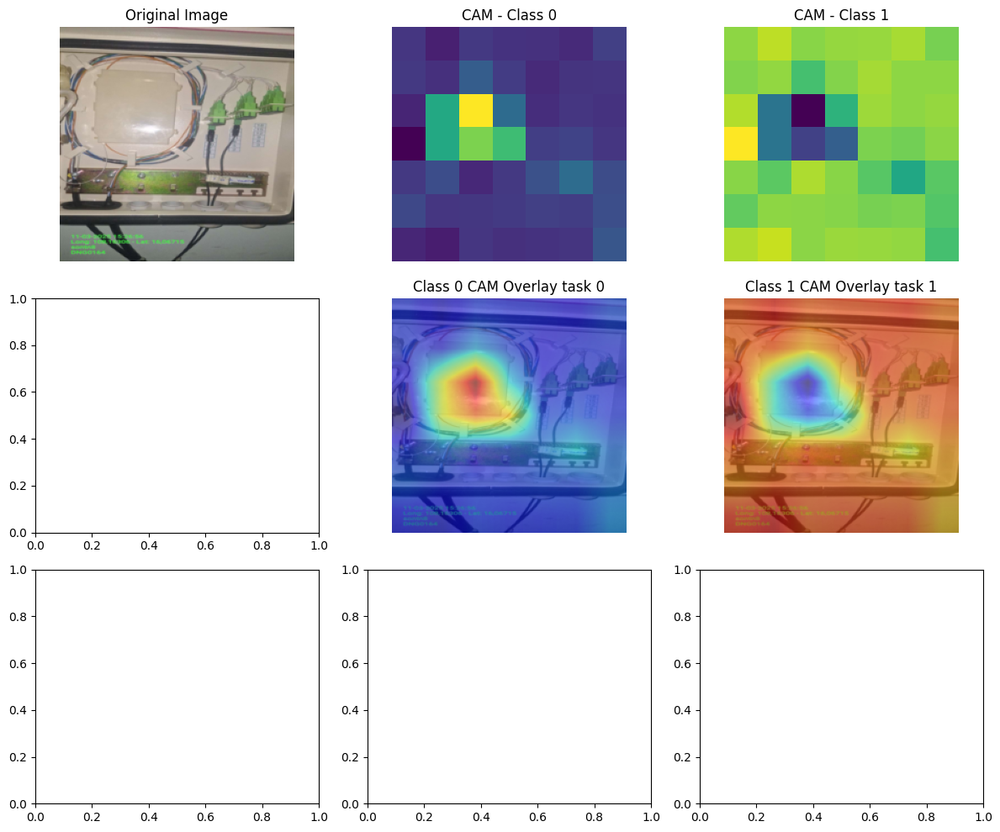

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.008026105..1.0000002].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.008026105..1.0000002].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.008026105..1.0000002].


out_pred: [{'task_name': 'han_box', 'probabilities': tensor([[9.9999e-01, 7.7096e-06]], device='cuda:0', grad_fn=<SoftmaxBackward0>), 'predicted_class_names': ['close']}]


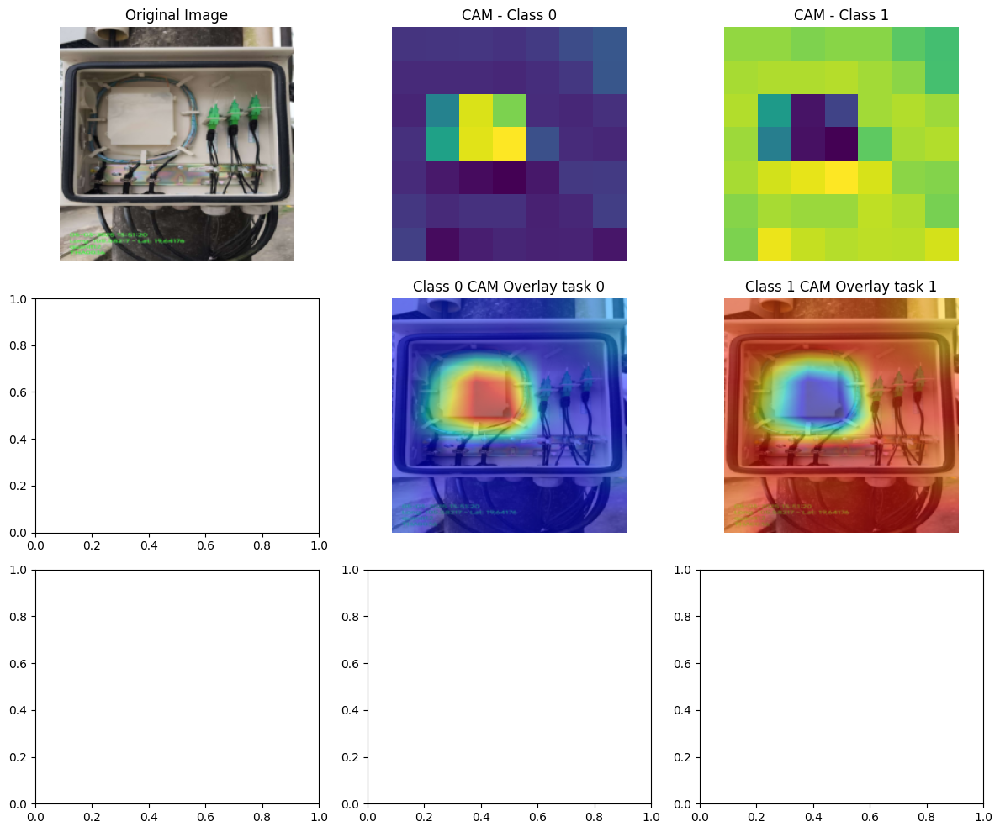

out_pred: [{'task_name': 'han_box', 'probabilities': tensor([[9.9999e-01, 6.7790e-06]], device='cuda:0', grad_fn=<SoftmaxBackward0>), 'predicted_class_names': ['close']}]


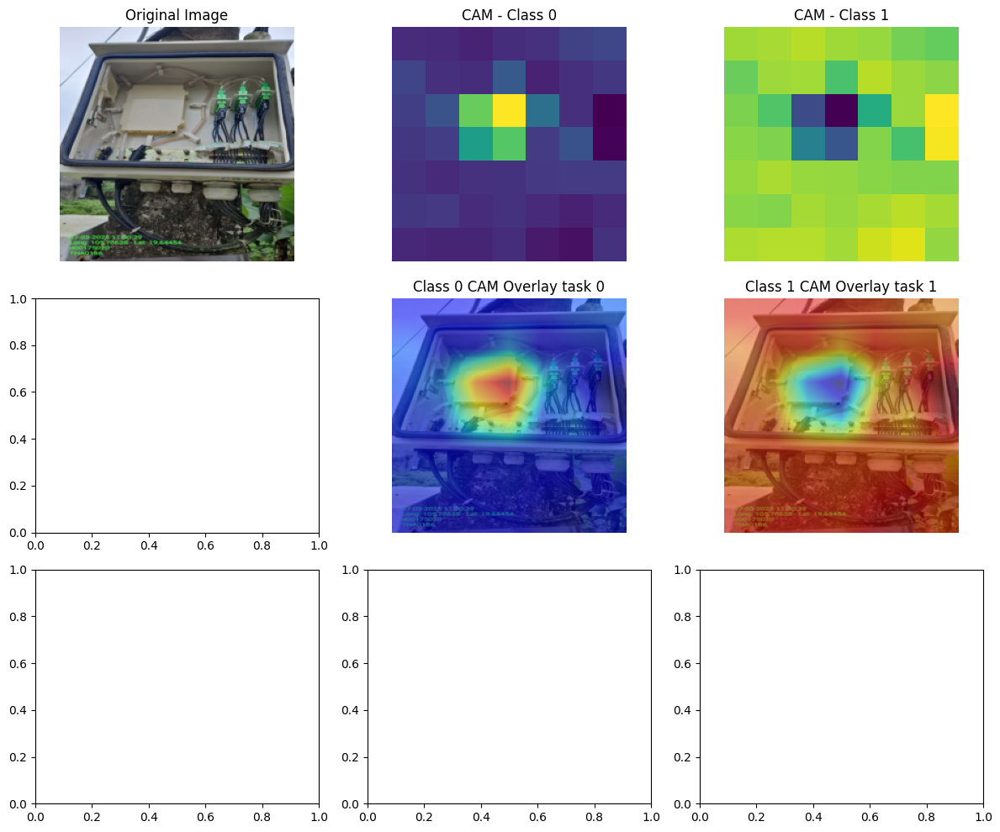

out_pred: [{'task_name': 'han_box', 'probabilities': tensor([[9.9997e-01, 3.0916e-05]], device='cuda:0', grad_fn=<SoftmaxBackward0>), 'predicted_class_names': ['close']}]


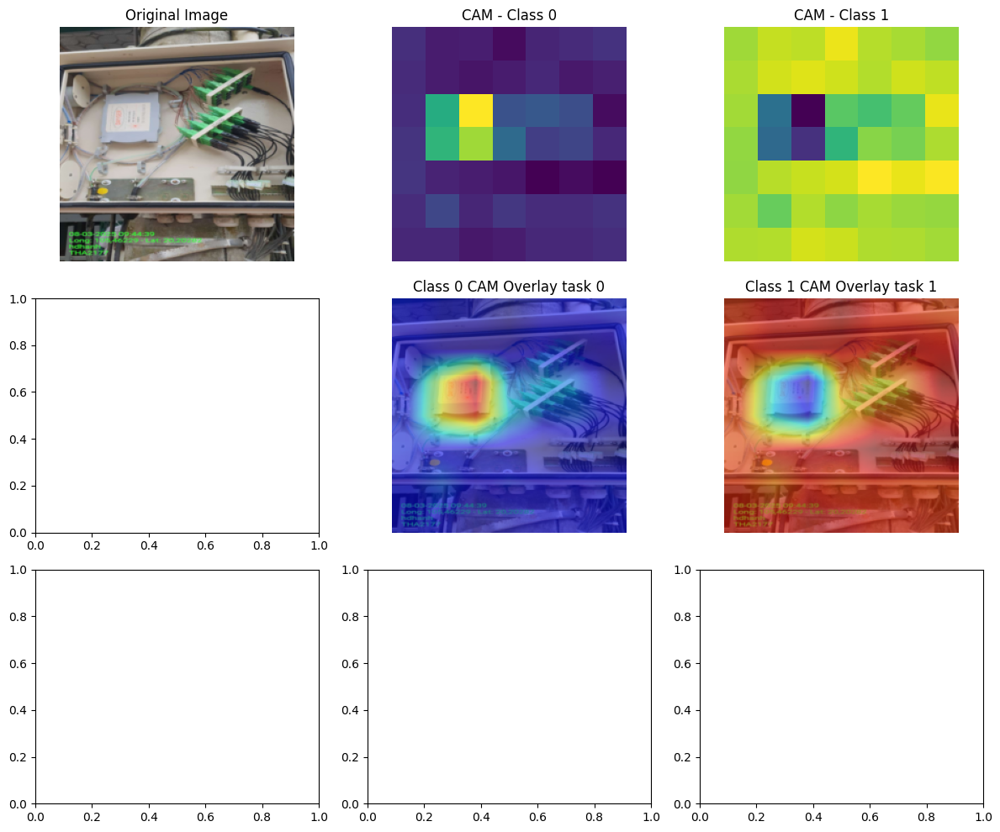

out_pred: [{'task_name': 'han_box', 'probabilities': tensor([[9.9998e-01, 2.3515e-05]], device='cuda:0', grad_fn=<SoftmaxBackward0>), 'predicted_class_names': ['close']}]


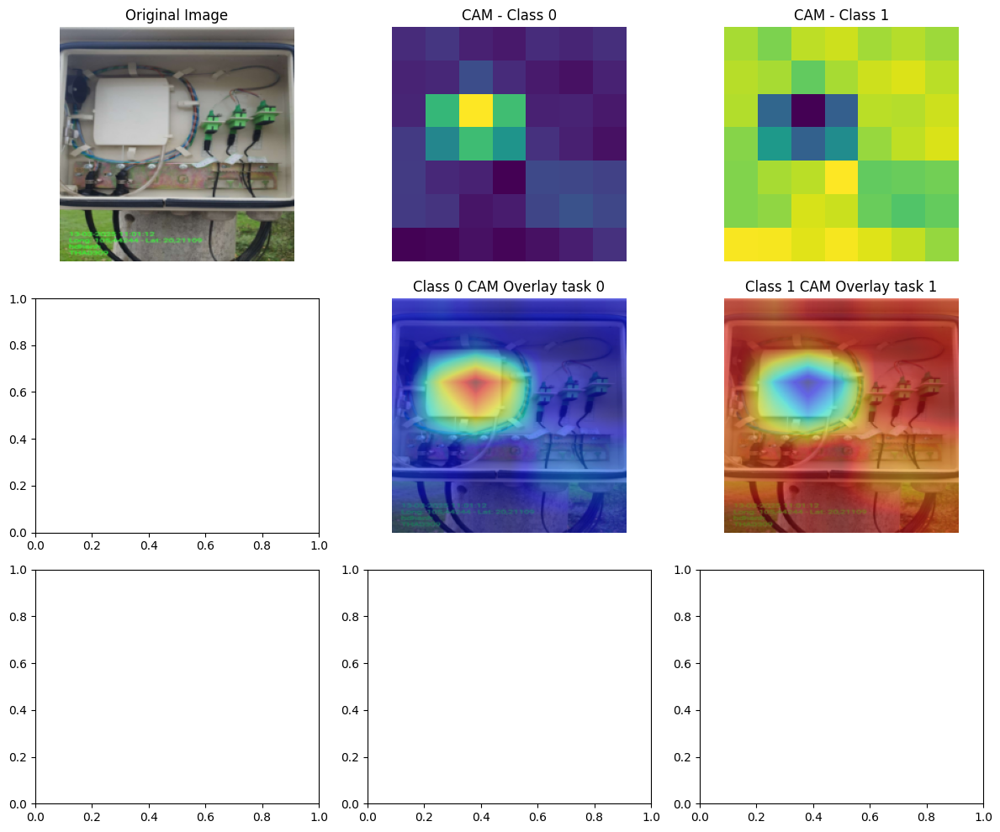

out_pred: [{'task_name': 'han_box', 'probabilities': tensor([[9.9998e-01, 1.9630e-05]], device='cuda:0', grad_fn=<SoftmaxBackward0>), 'predicted_class_names': ['close']}]


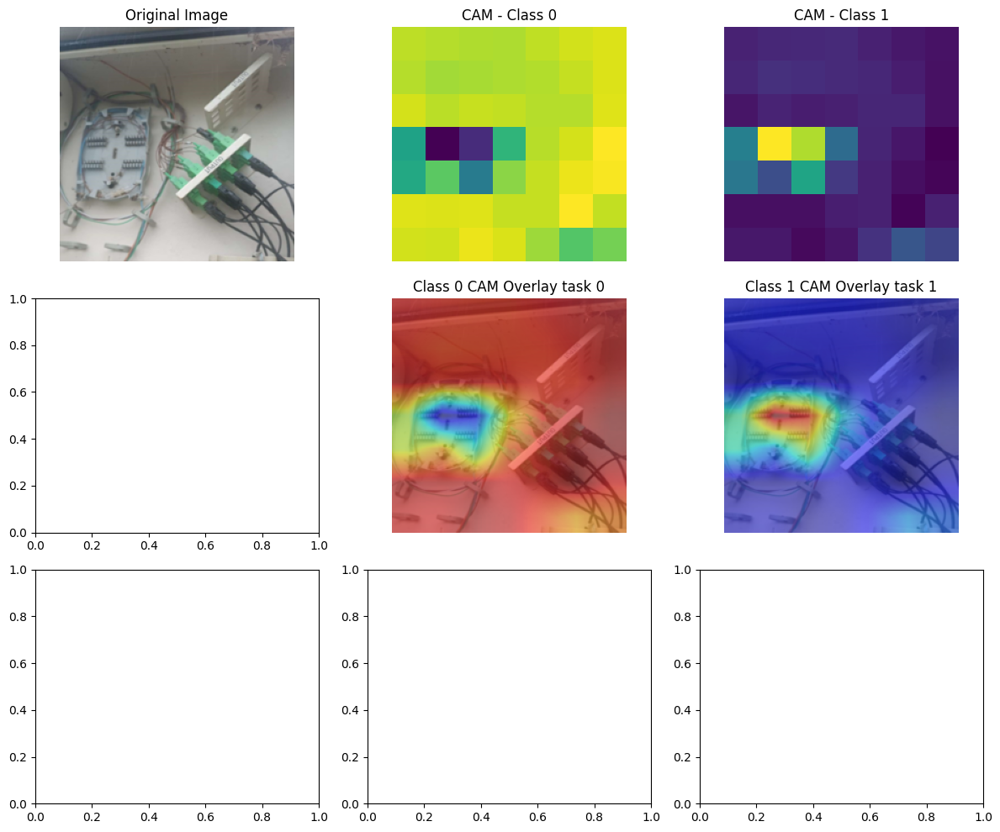

out_pred: [{'task_name': 'han_box', 'probabilities': tensor([[2.5522e-04, 9.9974e-01]], device='cuda:0', grad_fn=<SoftmaxBackward0>), 'predicted_class_names': ['open']}]


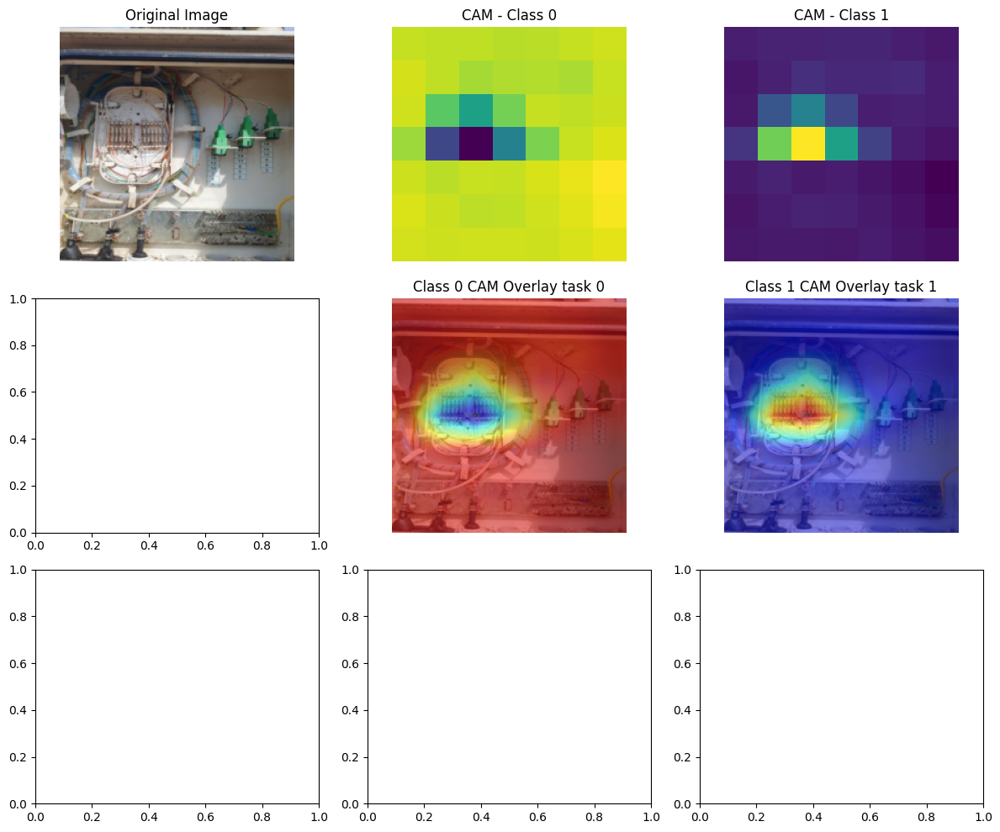

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.0000002].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.0000002].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.0000002].


out_pred: [{'task_name': 'han_box', 'probabilities': tensor([[1.0750e-05, 9.9999e-01]], device='cuda:0', grad_fn=<SoftmaxBackward0>), 'predicted_class_names': ['open']}]


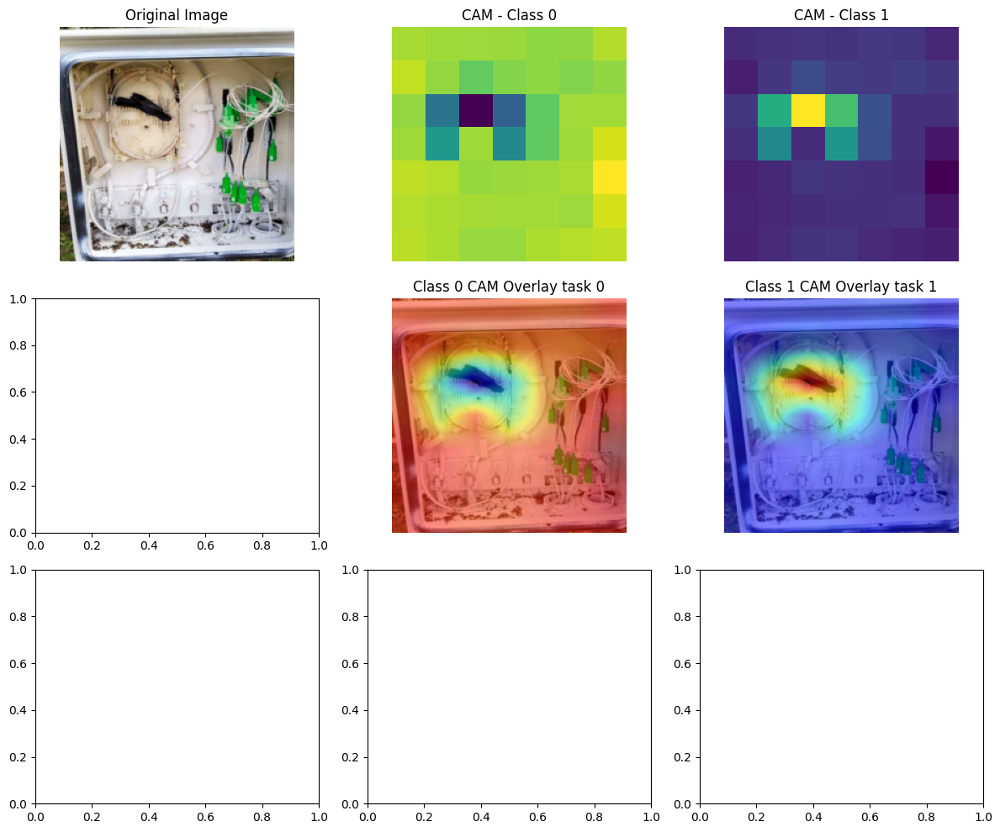

out_pred: [{'task_name': 'han_box', 'probabilities': tensor([[8.7051e-05, 9.9991e-01]], device='cuda:0', grad_fn=<SoftmaxBackward0>), 'predicted_class_names': ['open']}]


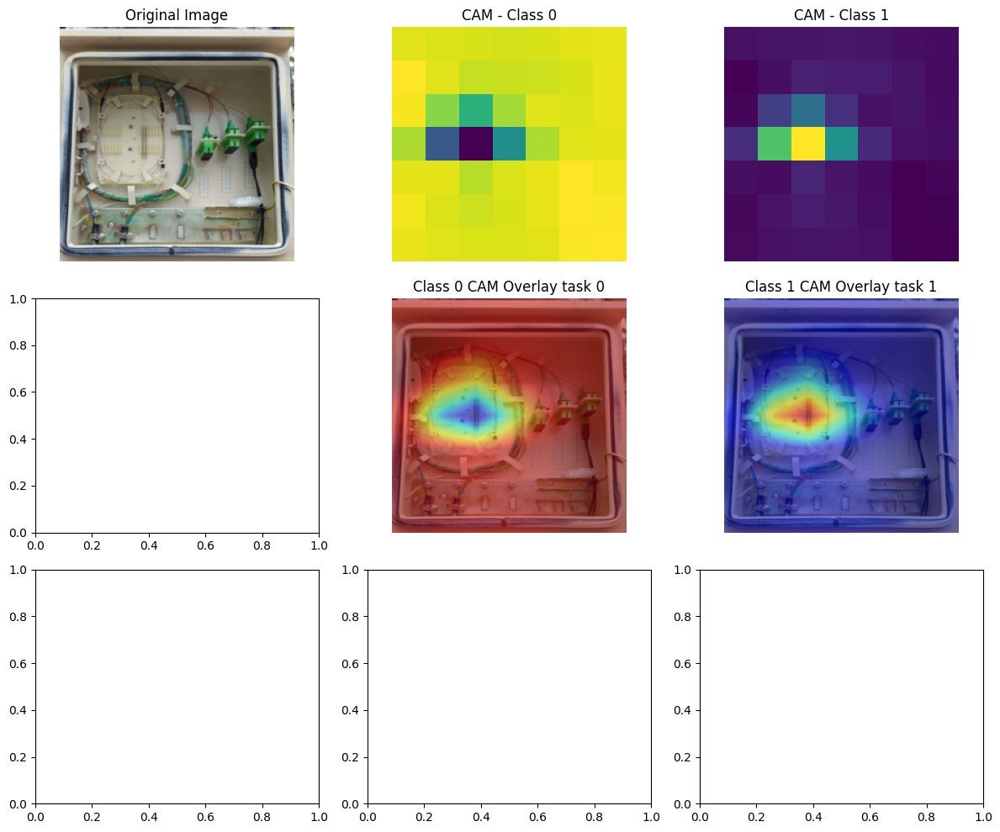

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0589113..1.0000002].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0589113..1.0000002].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0589113..1.0000002].


out_pred: [{'task_name': 'han_box', 'probabilities': tensor([[9.7541e-06, 9.9999e-01]], device='cuda:0', grad_fn=<SoftmaxBackward0>), 'predicted_class_names': ['open']}]


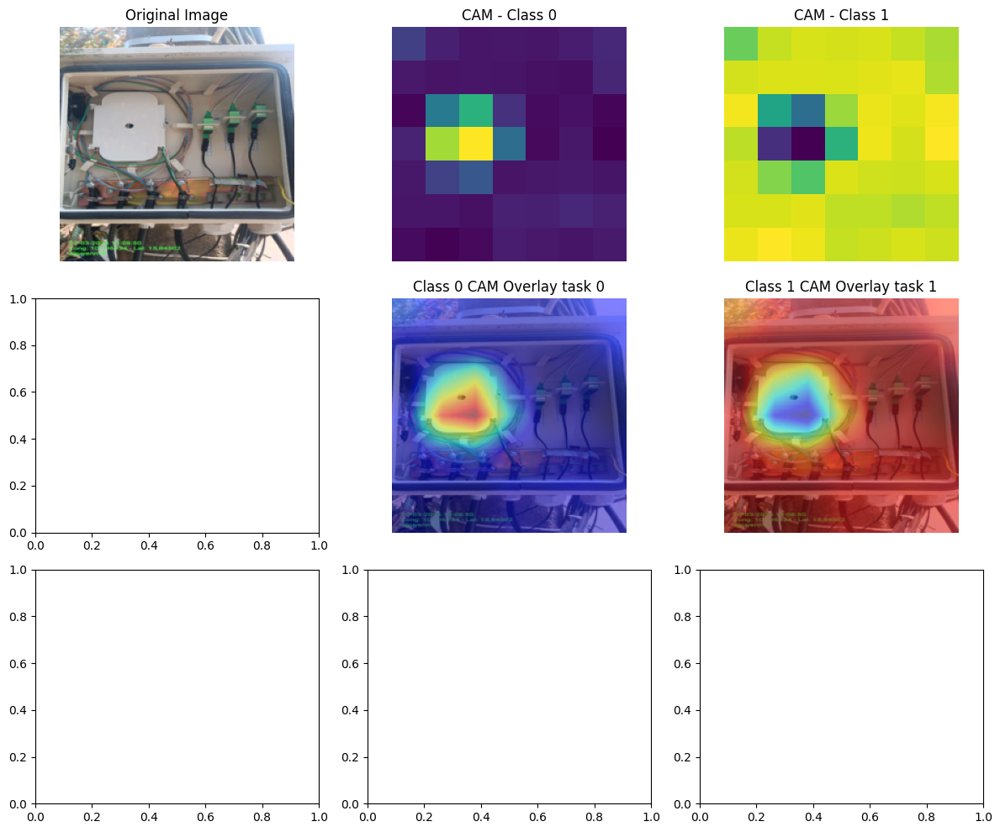

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.099254556..1.0000001].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.099254556..1.0000001].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.099254556..1.0000001].


out_pred: [{'task_name': 'han_box', 'probabilities': tensor([[1.0000e+00, 2.2953e-06]], device='cuda:0', grad_fn=<SoftmaxBackward0>), 'predicted_class_names': ['close']}]


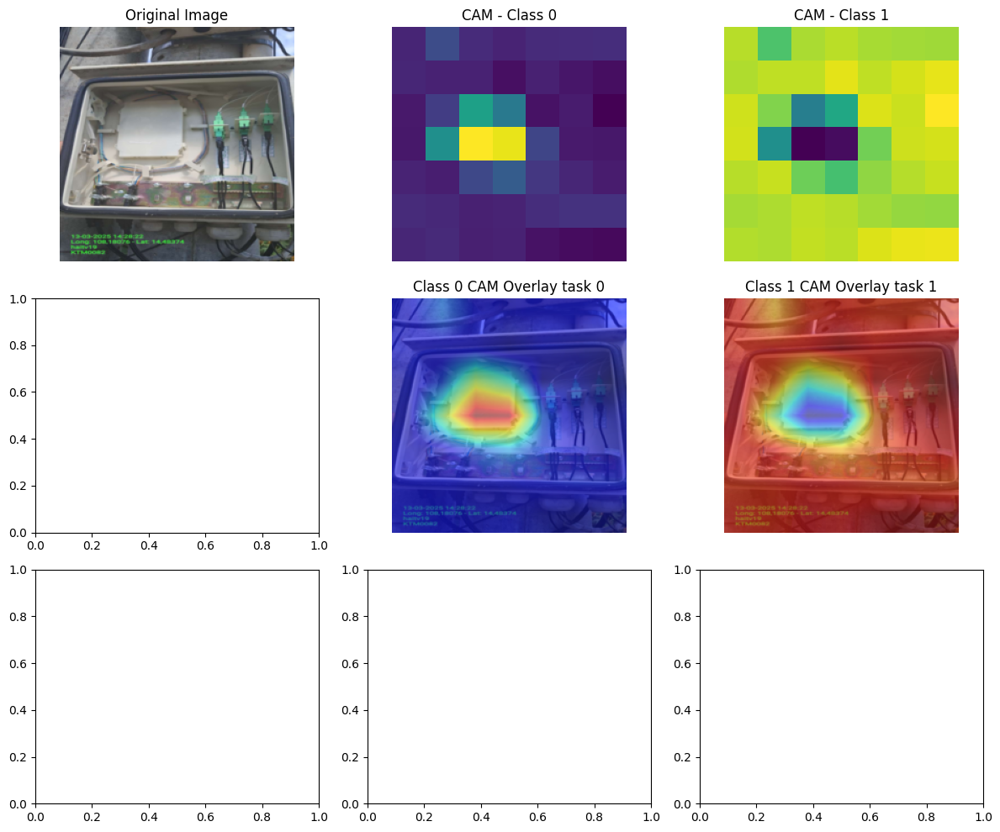

out_pred: [{'task_name': 'han_box', 'probabilities': tensor([[1.0000e+00, 3.5875e-06]], device='cuda:0', grad_fn=<SoftmaxBackward0>), 'predicted_class_names': ['close']}]


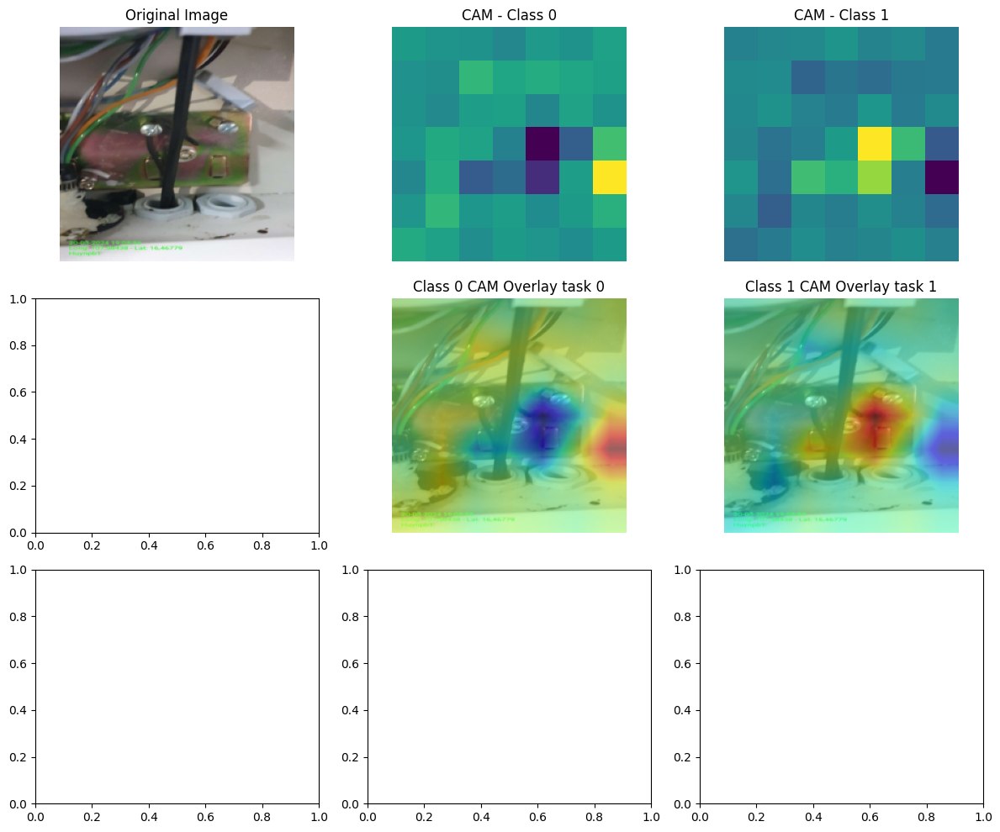

out_pred: [{'task_name': 'han_box', 'probabilities': tensor([[0.7133, 0.2867]], device='cuda:0', grad_fn=<SoftmaxBackward0>), 'predicted_class_names': ['close']}]


In [66]:
open_and_plot_cam("/home/treerspeaking/src/python/cabdefect/data/test_data/co_dinh_cap/Ảnh đúng/90.jpg", model_used)
open_and_plot_cam("/home/treerspeaking/src/python/cabdefect/data/test_data/co_dinh_cap/Ảnh đúng/91.jpg", model_used)
open_and_plot_cam("/home/treerspeaking/src/python/cabdefect/data/test_data/co_dinh_cap/Ảnh đúng/92.jpg", model_used)
open_and_plot_cam("/home/treerspeaking/src/python/cabdefect/data/test_data/co_dinh_cap/Ảnh đúng/93.jpg", model_used)
open_and_plot_cam("/home/treerspeaking/src/python/cabdefect/data/test_data/co_dinh_cap/Ảnh đúng/94.jpg", model_used)
open_and_plot_cam("/home/treerspeaking/src/python/cabdefect/data/test_data/co_dinh_cap/Ảnh đúng/95.jpg", model_used)
open_and_plot_cam("/home/treerspeaking/src/python/cabdefect/data/test_data/co_dinh_cap/Ảnh đúng/96.jpg", model_used)
open_and_plot_cam("/home/treerspeaking/src/python/cabdefect/data/test_data/co_dinh_cap/Ảnh đúng/97.jpg", model_used)
open_and_plot_cam("/home/treerspeaking/src/python/cabdefect/data/test_data/co_dinh_cap/Ảnh đúng/99.jpg", model_used)
open_and_plot_cam("/home/treerspeaking/src/python/cabdefect/data/test_data/co_dinh_cap/Ảnh đúng/100.jpg", model_used)
open_and_plot_cam("/home/treerspeaking/src/python/cabdefect/data/test_data/co_dinh_cap/Ảnh sai/53.jpg", model_used)
open_and_plot_cam("/home/treerspeaking/src/python/cabdefect/data/test_data/co_dinh_cap/Ảnh sai/55.jpg", model_used)
open_and_plot_cam("/home/treerspeaking/src/python/cabdefect/data/test_data/co_dinh_cap/Ảnh sai/56.jpg", model_used)
open_and_plot_cam("/home/treerspeaking/src/python/cabdefect/data/test_data/co_dinh_cap/Ảnh sai/57.jpg", model_used)
open_and_plot_cam("/home/treerspeaking/src/python/cabdefect/data/test_data/co_dinh_cap/Ảnh sai/58.jpg", model_used)
open_and_plot_cam("/home/treerspeaking/src/python/cabdefect/data/test_data/co_dinh_cap/Ảnh sai/59.jpg", model_used)
open_and_plot_cam("/home/treerspeaking/src/python/cabdefect/data/test_data/co_dinh_cap/Ảnh sai/60.jpg", model_used)
open_and_plot_cam("/home/treerspeaking/src/python/cabdefect/data/test_data/co_dinh_cap/Ảnh sai/61.jpg", model_used)
open_and_plot_cam("/home/treerspeaking/src/python/cabdefect/data/test_data/co_dinh_cap/Ảnh sai/62.jpg", model_used)
open_and_plot_cam("/home/treerspeaking/src/python/cabdefect/data/train_data/labeled/han_box/han_close/1.jpg", model_used)
open_and_plot_cam("/home/treerspeaking/src/python/cabdefect/data/train_data/labeled/han_box/han_close/3.jpg", model_used)
open_and_plot_cam("/home/treerspeaking/src/python/cabdefect/data/train_data/labeled/han_box/han_close/16.jpg", model_used)
open_and_plot_cam("/home/treerspeaking/src/python/cabdefect/data/train_data/labeled/han_box/han_close/19.jpg", model_used)
open_and_plot_cam("/home/treerspeaking/src/python/cabdefect/data/train_data/labeled/han_box/han_open/Ảnh sai 1.jpg" , model_used)
open_and_plot_cam("/home/treerspeaking/src/python/cabdefect/data/train_data/labeled/han_box/han_open/Ảnh sai 2.jpg" , model_used)
open_and_plot_cam("/home/treerspeaking/src/python/cabdefect/data/train_data/labeled/han_box/han_open/Ảnh sai 3.jpg" , model_used)
open_and_plot_cam("/home/treerspeaking/src/python/cabdefect/data/train_data/labeled/han_box/han_open/Ảnh sai 4.jpg" , model_used)
open_and_plot_cam("/home/treerspeaking/src/python/cabdefect/data/train_data/labeled/co_dinh_cap/Ảnh đúng/1.jpg" , model_used)
open_and_plot_cam("/home/treerspeaking/src/python/cabdefect/data/test_data/co_dinh_cap/Ảnh đúng/99.jpg" , model_used)
open_and_plot_cam("/home/treerspeaking/src/python/cabdefect/data/test_data/co_dinh_cap/Ảnh sai/55.jpg" , model_used)




In [60]:
import numpy as np
from PIL import Image

def open_image(img_path):
    return np.array(Image.open(img_path).convert("RGB"))

In [32]:
from utils.augmentation import MyRandAugment
from torchvision.transforms import v2

strong_aug = v2.Compose([
    v2.ToTensor(),
    v2.Resize([224, 224]),
    v2.RandAugment(),
    # v2.Normalize(mean=[0.485, 0.456, 0.406],
    #                      std=[0.229, 0.224, 0.225]),
])

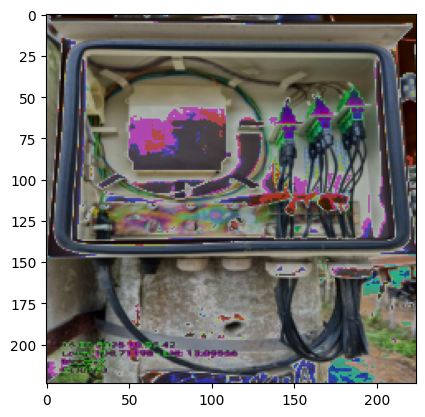

In [33]:
img = open_image("/home/treerspeaking/src/python/cabdefect/data/test_data/co_dinh_cap/Ảnh đúng/90.jpg")

img = strong_aug(img)
plt.imshow(img.permute(1,2,0))

In [34]:
from dataset.SupervisedDataset import SupervisedDataModule
from dataset.Dataset import MultiTaskCabDataset
from torchvision.transforms import v2

strong_aug = v2.Compose([
    v2.ToTensor(),
    v2.Resize([224, 224]),
    # v2.RandAugment(),
    # v2.Normalize(mean=[0.485, 0.456, 0.406],
    #                      std=[0.229, 0.224, 0.225]),
])

data = SupervisedDataModule(
        dataset=MultiTaskCabDataset, 
        root="./data_more_label", 
        batch_size=16,
        val_batch_size=1, 
        num_workers=2, 
        train_transforms=strong_aug,
        val_transforms=strong_aug, 
        test_transforms=strong_aug, 
        download=False
    )

data.setup("fit")

Discovered task: han_box with classes: ['close', 'open']
Loaded 459 images for train split
Discovered task: han_box with classes: ['close', 'open']
Loaded 50 images for val split


In [15]:
train_dataloader = data.train_dataloader()

In [16]:
# 0 close
# 1 open

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.0000004].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.008403514..1.0000001].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0800884..1.0000004].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.04024269..1.0000002].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0055899075..1.0000002].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.0000002].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.047722846..1.000000

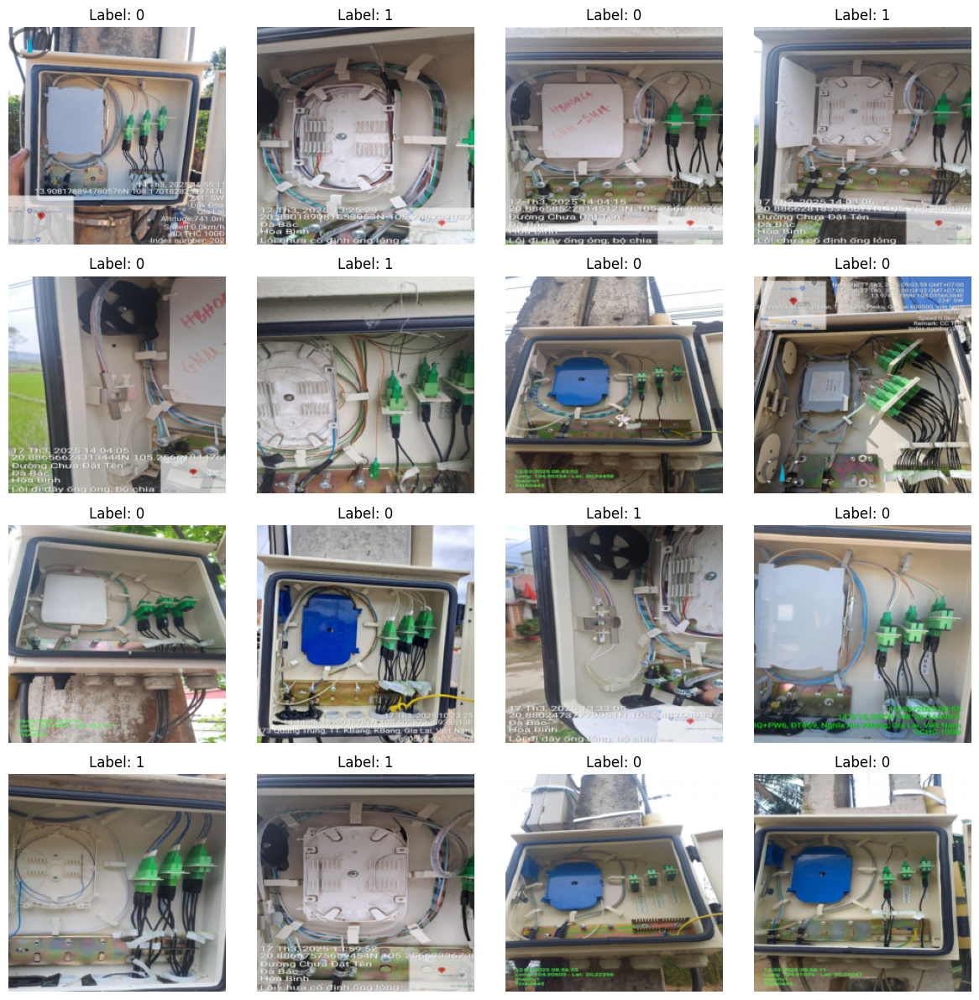

In [17]:
import matplotlib.pyplot as plt

# Get a batch of images from the dataloader
batch = next(iter(train_dataloader))
images, labels = batch

labels = labels[0]

# Create a figure to display multiple images in a grid
fig, axes = plt.subplots(4, 4, figsize=(12, 12))
axes = axes.flatten()

# Plot up to 16 images (or fewer if the batch is smaller)
num_images = min(16, images.shape[0])

for i in range(num_images):
    # Convert from tensor format [C,H,W] to [H,W,C] for plotting
    img = images[i].permute(1, 2, 0)
    
    # Plot the image
    axes[i].imshow(img)
    axes[i].set_title(f"Label: {labels[i].item()}")
    axes[i].axis('off')

# Hide any unused subplots
for i in range(num_images, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()